In [42]:
##### Feature Importance Code

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import io
import time

from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, log_loss, accuracy_score, f1_score
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor

In [43]:
def feature_importances_histo(clf, file_name_path, file_name_generalScore, X_train, y_train=None,
                              top_n=10, figsize=(8, 8), print_table=False, title="Feature Importances"):
    __name__ = "feature_importances_histo"

    # try:
    if not hasattr(clf, 'feature_importances_'):
        clf.fit(X_train.values, y_train.values.ravel())

        if not hasattr(clf, 'feature_importances_'):
            raise AttributeError("{} does not have feature_importances_ attribute".
                                 format(clf.__class__.__name__))

    feat_imp = pd.DataFrame({title: clf.feature_importances_})
    feat_imp['feature'] = X_train.columns
    dfAllResults['feature'] = X_train.columns
    dfAllResults[title] = clf.feature_importances_
    feat_imp = feat_imp.iloc[:top_n]
    feat_imp.sort_values(by='feature', ascending=False, inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)

    print("\n================  Feature Importance  ==============")
    print(title)
    print("____________________________________________________")
    print(feat_imp)
    print("----------------------------------------------------")

    feat_imp.plot.barh(title=title, figsize=figsize)
    plt.xlabel('Feature Importance Score')
    plt.rcParams.update({'font.size': 5})
    # plt.show()
    # plt.savefig(os.path.join(file_name_path, title + file_name_generalScore))

    if print_table:
        from IPython.display import display
        print("Top {} features in descending order of importance".format(top_n))
        display(feat_imp.sort_values(by='feature', ascending=False))

    return feat_imp


|------------------------------------|

Artix-7

|------------------------------------|

['Column1', 'DEVICE', 'BOARD', 'FUNCTION', 'DATA_TYPE', 'ID_VAL', 'DSP', 'BRAM', 'Flip_Flop', 'Area', 'min_Slack', 'Max_Freq', 'Time', 'Energy', 'BugsDelivered', 'DifficultyLevel', 'DistinctOperands', 'DistinctOperators', 'Effort', 'ProgramLength', 'ProgramLevel', 'ProgramVolume', 'TimeToImplement', 'TotalOperators', 'Total_Operands', 'VocabularySize', 'Sloc', 'DecisionPoint', 'GlobalVariables', 'If', 'Loop', 'Goto', 'Assignment', 'ExitPoint', 'Function.1', 'FunctionCall', 'PointerDereferencing', 'CyclomaticComplexity', 'SyntacticallyReachableFunctions', 'SemanticallyReachedFunctions', 'CoverageEstimation', 'SCALAR_INPUT', 'RANGE_SCALAR_VALUES', 'SCALAR_INDEX_INPUT', 'RANGE_SCALAR_INDEX_VALUES', 'ARRAY_INPUT', 'RANGE_ARRAY_INPUT', 'cInstr', 'assemblyInstr', 'clockCycles', 'CC4CS', 'Bugs_Delivered', 'SS_VAL_1', 'SV_VAL_1', 'SV_VAL_2', 'V_VAL_1', 'V_VAL_2', 'V_VAL_3', 'V_VAL_4', 'V_VAL_5', 'V_VAL_6'


================  Feature Importance  ==============
RandomForestRegressor
____________________________________________________
                RandomForestRegressor
feature                              
cInstr                       0.017202
VocabularySize               0.000788
V_VAL_9                      0.004584
V_VAL_8                      0.004251
V_VAL_7                      0.007524
...                               ...
Column1                      0.010253
Bugs_Delivered               0.003441
BugsDelivered                0.002805
Assignment                   0.000000
ARRAY_INPUT                  0.248208

[99 rows x 1 columns]
----------------------------------------------------
                   ExtraTreesRegressor  GradientBoostingRegressor  \
feature                                                             
Column1                       0.001508                   0.000277   
BugsDelivered                 0.022111                   0.000027   
DifficultyLevel          


=============   Feature Importance Mean Score   =============
                        avg
feature                    
Column1            0.351666
BugsDelivered      0.026879
DifficultyLevel    0.040174
DistinctOperands   0.051879
DistinctOperators  0.001603
...                     ...
M_VAL_28           0.005671
M_VAL_29           0.004167
M_VAL_30           0.003024
M_VAL_31           0.010055
M_VAL_32           0.002093

[99 rows x 1 columns]

=============   Feature Pruned by Score   =============
                           avg
feature                       
Column1               0.351666
DistinctOperands      0.051879
PointerDereferencing  0.228405
ARRAY_INPUT           0.321322
['Column1', 'DistinctOperands', 'PointerDereferencing', 'ARRAY_INPUT']

|------------------------------------|

Flip_Flop

|------------------------------------|


================  Feature Importance  ==============
ExtraTreesRegressor
____________________________________________________
                E


================  Feature Importance  ==============
AdaBoostRegressor
____________________________________________________
                AdaBoostRegressor
feature                          
cInstr               5.802412e-07
VocabularySize       1.930410e-03
V_VAL_9              0.000000e+00
V_VAL_8              0.000000e+00
V_VAL_7              0.000000e+00
...                           ...
Column1              2.009188e-02
Bugs_Delivered       1.827223e-06
BugsDelivered        1.673432e-06
Assignment           1.682565e-02
ARRAY_INPUT          3.223553e-04

[99 rows x 1 columns]
----------------------------------------------------


C:\Users\vitto\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)



================  Feature Importance  ==============
RandomForestRegressor
____________________________________________________
                RandomForestRegressor
feature                              
cInstr                       0.000059
VocabularySize               0.000107
V_VAL_9                      0.000018
V_VAL_8                      0.000003
V_VAL_7                      0.000004
...                               ...
Column1                      0.017604
Bugs_Delivered               0.001694
BugsDelivered                0.000752
Assignment                   0.020719
ARRAY_INPUT                  0.000164

[99 rows x 1 columns]
----------------------------------------------------
                   ExtraTreesRegressor  GradientBoostingRegressor  \
feature                                                             
Column1                       0.025050                   0.012280   
BugsDelivered                 0.000105                   0.000033   
DifficultyLevel          

C:\Users\vitto\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:303: RuntimeWarning: invalid value encountered in divide
  sum(
C:\Users\vitto\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:303: RuntimeWarning: invalid value encountered in divide
  sum(



================  Feature Importance  ==============
RandomForestRegressor
____________________________________________________
                RandomForestRegressor
feature                              
cInstr                   1.899996e-17
VocabularySize           1.674207e-17
V_VAL_9                  1.559535e-17
V_VAL_8                  2.302746e-17
V_VAL_7                  2.121038e-17
...                               ...
Column1                  2.050762e-17
Bugs_Delivered           2.845449e-04
BugsDelivered            1.182404e-04
Assignment               0.000000e+00
ARRAY_INPUT              1.286876e-04

[99 rows x 1 columns]
----------------------------------------------------
                   ExtraTreesRegressor  GradientBoostingRegressor  \
feature                                                             
Column1                       0.005030               2.173024e-16   
BugsDelivered                 0.008550               2.343609e-05   
DifficultyLevel          


=============   Feature Importance Mean Score   =============
                        avg
feature                    
Column1            0.869906
BugsDelivered      0.061966
DifficultyLevel    0.093449
DistinctOperands   0.120514
DistinctOperators  0.062616
...                     ...
M_VAL_28           0.012305
M_VAL_29           0.008780
M_VAL_30           0.006653
M_VAL_31           0.020918
M_VAL_32           0.004911

[99 rows x 1 columns]

=============   Feature Pruned by Score   =============
                                      avg
feature                                  
Column1                          0.869906
BugsDelivered                    0.061966
DifficultyLevel                  0.093449
DistinctOperands                 0.120514
DistinctOperators                0.062616
ProgramVolume                    0.062386
TotalOperators                   0.056282
Total_Operands                   0.055330
VocabularySize                   0.066069
Sloc                           


================  Feature Importance  ==============
ExtraTreesRegressor
____________________________________________________
                ExtraTreesRegressor
feature                            
cInstr                     0.016438
VocabularySize             0.004519
V_VAL_9                    0.001361
V_VAL_8                    0.001020
V_VAL_7                    0.000225
...                             ...
Column1                    0.009299
Bugs_Delivered             0.007394
BugsDelivered              0.007407
Assignment                 0.018020
ARRAY_INPUT                0.351017

[99 rows x 1 columns]
----------------------------------------------------

================  Feature Importance  ==============
GradientBoostingRegressor
____________________________________________________
                GradientBoostingRegressor
feature                                  
cInstr                       6.641056e-02
VocabularySize               8.979139e-04
V_VAL_9                     

                   ExtraTreesRegressor  GradientBoostingRegressor  \
feature                                                             
Column1                       0.182362                   0.481247   
BugsDelivered                 0.017810                   0.023699   
DifficultyLevel               0.005067                   0.008121   
DistinctOperands              0.035284                   0.024681   
DistinctOperators             0.002886                   0.000523   
...                                ...                        ...   
M_VAL_28                      0.001735                   0.000024   
M_VAL_29                      0.003959                   0.003656   
M_VAL_30                      0.001024                   0.000035   
M_VAL_31                      0.002116                   0.000086   
M_VAL_32                      0.001131                   0.000069   

                   AdaBoostRegressor  RandomForestRegressor       sum  \
feature                      


================  Feature Importance  ==============
ExtraTreesRegressor
____________________________________________________
                ExtraTreesRegressor
feature                            
cInstr                     0.000182
VocabularySize             0.000507
V_VAL_9                    0.000007
V_VAL_8                    0.000003
V_VAL_7                    0.000016
...                             ...
Column1                    0.000379
Bugs_Delivered             0.000246
BugsDelivered              0.000282
Assignment                 0.012568
ARRAY_INPUT                0.000205

[99 rows x 1 columns]
----------------------------------------------------

================  Feature Importance  ==============
GradientBoostingRegressor
____________________________________________________
                GradientBoostingRegressor
feature                                  
cInstr                       4.565747e-04
VocabularySize               5.156305e-04
V_VAL_9                     


================  Feature Importance  ==============
RandomForestRegressor
____________________________________________________
                RandomForestRegressor
feature                              
cInstr                   1.331334e-04
VocabularySize           3.282723e-02
V_VAL_9                  1.222686e-18
V_VAL_8                 -1.135999e-19
V_VAL_7                  0.000000e+00
...                               ...
Column1                  1.457811e-02
Bugs_Delivered           1.166131e-01
BugsDelivered            6.572737e-02
Assignment               5.820496e-04
ARRAY_INPUT              1.632149e-01

[99 rows x 1 columns]
----------------------------------------------------
                   ExtraTreesRegressor  GradientBoostingRegressor  \
feature                                                             
Column1                   1.725481e-02               1.214641e-02   
BugsDelivered             1.272668e-03               6.029202e-02   
DifficultyLevel          


=============   Feature Importance Mean Score   =============
                        avg
feature                    
Column1            0.693215
BugsDelivered      0.149756
DifficultyLevel    0.041336
DistinctOperands   0.092251
DistinctOperators  0.120218
...                     ...
M_VAL_28           0.002452
M_VAL_29           0.010072
M_VAL_30           0.002921
M_VAL_31           0.001810
M_VAL_32           0.006086

[99 rows x 1 columns]

=============   Feature Pruned by Score   =============
                                      avg
feature                                  
Column1                          0.693215
BugsDelivered                    0.149756
DistinctOperands                 0.092251
DistinctOperators                0.120218
ProgramLength                    0.057232
ProgramVolume                    0.153451
TotalOperators                   0.065589
Total_Operands                   0.087667
VocabularySize                   0.085138
Sloc                           


================  Feature Importance  ==============
ExtraTreesRegressor
____________________________________________________
                ExtraTreesRegressor
feature                            
cInstr                     0.018588
VocabularySize             0.005010
V_VAL_9                    0.009039
V_VAL_8                    0.014091
V_VAL_7                    0.018245
...                             ...
Column1                    0.014579
Bugs_Delivered             0.010775
BugsDelivered              0.015257
Assignment                 0.000000
ARRAY_INPUT                0.151733

[99 rows x 1 columns]
----------------------------------------------------

================  Feature Importance  ==============
GradientBoostingRegressor
____________________________________________________
                GradientBoostingRegressor
feature                                  
cInstr                           0.015932
VocabularySize                   0.000339
V_VAL_9                     


=============   Feature Importance Mean Score   =============
                        avg
feature                    
Column1            0.314552
BugsDelivered      0.020462
DifficultyLevel    0.078769
DistinctOperands   0.034182
DistinctOperators  0.001539
...                     ...
M_VAL_28           0.034464
M_VAL_29           0.010967
M_VAL_30           0.003492
M_VAL_31           0.017855
M_VAL_32           0.003058

[99 rows x 1 columns]

=============   Feature Pruned by Score   =============
                           avg
feature                       
Column1               0.314552
DifficultyLevel       0.078769
Goto                  0.083565
PointerDereferencing  0.141979
ARRAY_INPUT           0.197475
SS_VAL_1              0.065465
['Column1', 'DifficultyLevel', 'Goto', 'PointerDereferencing', 'ARRAY_INPUT', 'SS_VAL_1']

|------------------------------------|

Flip_Flop

|------------------------------------|


================  Feature Importance  ==============
ExtraTree


================  Feature Importance  ==============
AdaBoostRegressor
____________________________________________________
                AdaBoostRegressor
feature                          
cInstr                   0.000000
VocabularySize           0.000393
V_VAL_9                  0.000000
V_VAL_8                  0.000000
V_VAL_7                  0.000000
...                           ...
Column1                  0.022301
Bugs_Delivered           0.000207
BugsDelivered            0.001238
Assignment               0.038685
ARRAY_INPUT              0.000554

[99 rows x 1 columns]
----------------------------------------------------

================  Feature Importance  ==============
RandomForestRegressor
____________________________________________________
                RandomForestRegressor
feature                              
cInstr                       0.000693
VocabularySize               0.000463
V_VAL_9                      0.000007
V_VAL_8                      0.000057



=============   Feature Importance Mean Score   =============
                        avg
feature                    
Column1            0.878763
BugsDelivered      0.040577
DifficultyLevel    0.145463
DistinctOperands   0.079548
DistinctOperators  0.360805
...                     ...
M_VAL_28           0.060437
M_VAL_29           0.019451
M_VAL_30           0.007437
M_VAL_31           0.031059
M_VAL_32           0.005618

[99 rows x 1 columns]

=============   Feature Pruned by Score   =============
                                      avg
feature                                  
Column1                          0.878763
DifficultyLevel                  0.145463
DistinctOperands                 0.079548
DistinctOperators                0.360805
TimeToImplement                  0.062321
TotalOperators                   0.074188
Total_Operands                   0.062188
Sloc                             0.579771
DecisionPoint                    0.272305
If                             


|------------------------------------|

clockCycles

|------------------------------------|


================  Feature Importance  ==============
ExtraTreesRegressor
____________________________________________________
                ExtraTreesRegressor
feature                            
cInstr                 3.092886e-01
VocabularySize         2.287633e-03
V_VAL_9                1.479951e-06
V_VAL_8                6.877413e-07
V_VAL_7                9.688207e-07
...                             ...
Column1                4.003332e-02
Bugs_Delivered         8.898849e-03
BugsDelivered          1.254739e-02
Assignment             3.176636e-02
ARRAY_INPUT            3.970296e-05

[99 rows x 1 columns]
----------------------------------------------------

================  Feature Importance  ==============
GradientBoostingRegressor
____________________________________________________
                GradientBoostingRegressor
feature                                  
cInstr            


================  Feature Importance  ==============
ExtraTreesRegressor
____________________________________________________
                ExtraTreesRegressor
feature                            
cInstr                     0.016475
VocabularySize             0.004953
V_VAL_9                    0.003065
V_VAL_8                    0.002314
V_VAL_7                    0.001505
...                             ...
Column1                    0.002409
Bugs_Delivered             0.017127
BugsDelivered              0.019378
Assignment                 0.008738
ARRAY_INPUT                0.318422

[99 rows x 1 columns]
----------------------------------------------------

================  Feature Importance  ==============
GradientBoostingRegressor
____________________________________________________
                GradientBoostingRegressor
feature                                  
cInstr                           0.008056
VocabularySize                   0.000891
V_VAL_9                     


=============   Feature Importance Mean Score   =============
                        avg
feature                    
Column1            0.231504
BugsDelivered      0.016061
DifficultyLevel    0.111684
DistinctOperands   0.021077
DistinctOperators  0.000842
...                     ...
M_VAL_28           0.014245
M_VAL_29           0.012217
M_VAL_30           0.003361
M_VAL_31           0.005482
M_VAL_32           0.004066

[99 rows x 1 columns]

=============   Feature Pruned by Score   =============
                           avg
feature                       
Column1               0.231504
DifficultyLevel       0.111684
Goto                  0.098622
PointerDereferencing  0.289172
ARRAY_INPUT           0.300813
['Column1', 'DifficultyLevel', 'Goto', 'PointerDereferencing', 'ARRAY_INPUT']

|------------------------------------|

Flip_Flop

|------------------------------------|


================  Feature Importance  ==============
ExtraTreesRegressor
________________________________


================  Feature Importance  ==============
AdaBoostRegressor
____________________________________________________
                AdaBoostRegressor
feature                          
cInstr                   0.005076
VocabularySize           0.001127
V_VAL_9                  0.000000
V_VAL_8                  0.000000
V_VAL_7                  0.000000
...                           ...
Column1                  0.052779
Bugs_Delivered           0.001775
BugsDelivered            0.003976
Assignment               0.012786
ARRAY_INPUT              0.000000

[99 rows x 1 columns]
----------------------------------------------------

================  Feature Importance  ==============
RandomForestRegressor
____________________________________________________
                RandomForestRegressor
feature                              
cInstr                       0.006285
VocabularySize               0.002047
V_VAL_9                      0.000186
V_VAL_8                      0.000021



=============   Feature Importance Mean Score   =============
                        avg
feature                    
Column1            0.471965
BugsDelivered      0.033071
DifficultyLevel    0.202127
DistinctOperands   0.043426
DistinctOperators  0.044333
...                     ...
M_VAL_28           0.025221
M_VAL_29           0.021983
M_VAL_30           0.010020
M_VAL_31           0.009788
M_VAL_32           0.018989

[99 rows x 1 columns]

=============   Feature Pruned by Score   =============
                                      avg
feature                                  
Column1                          0.471965
DifficultyLevel                  0.202127
Effort                           0.180733
TimeToImplement                  0.395425
Total_Operands                   0.083040
Sloc                             0.615160
DecisionPoint                    0.240464
If                               0.159900
Goto                             0.178770
ExitPoint                      


================  Feature Importance  ==============
ExtraTreesRegressor
____________________________________________________
                ExtraTreesRegressor
feature                            
cInstr                 4.627778e-01
VocabularySize         7.200320e-04
V_VAL_9                1.582253e-06
V_VAL_8                9.536329e-07
V_VAL_7                7.413222e-07
...                             ...
Column1                1.587622e-02
Bugs_Delivered         4.389144e-03
BugsDelivered          1.119717e-02
Assignment             3.334463e-02
ARRAY_INPUT            6.846526e-05

[99 rows x 1 columns]
----------------------------------------------------

================  Feature Importance  ==============
GradientBoostingRegressor
____________________________________________________
                GradientBoostingRegressor
feature                                  
cInstr                       6.803665e-01
VocabularySize               2.429873e-03
V_VAL_9                     

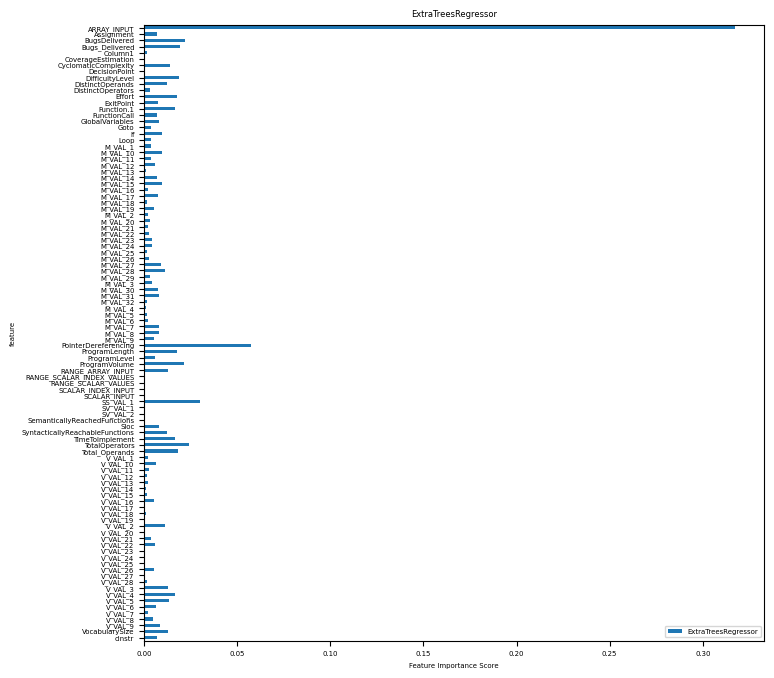

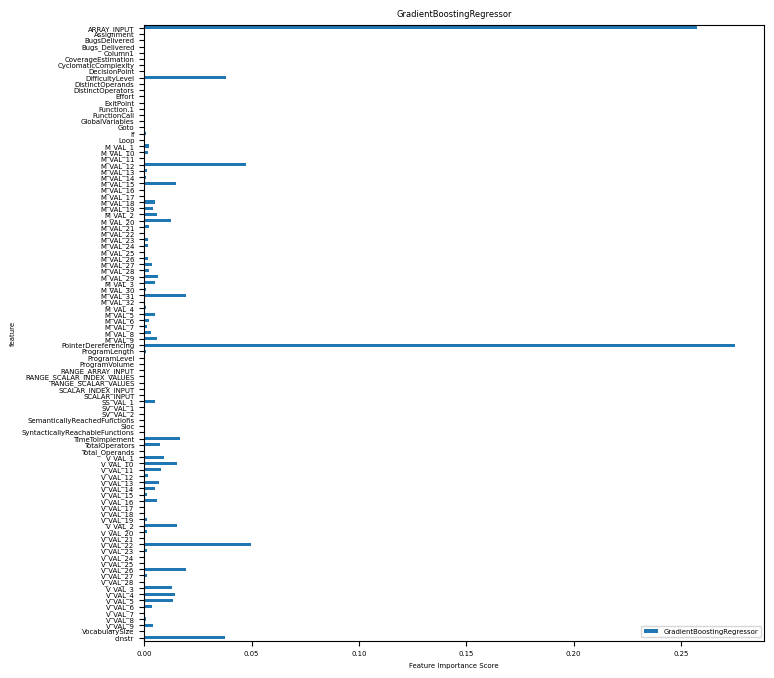

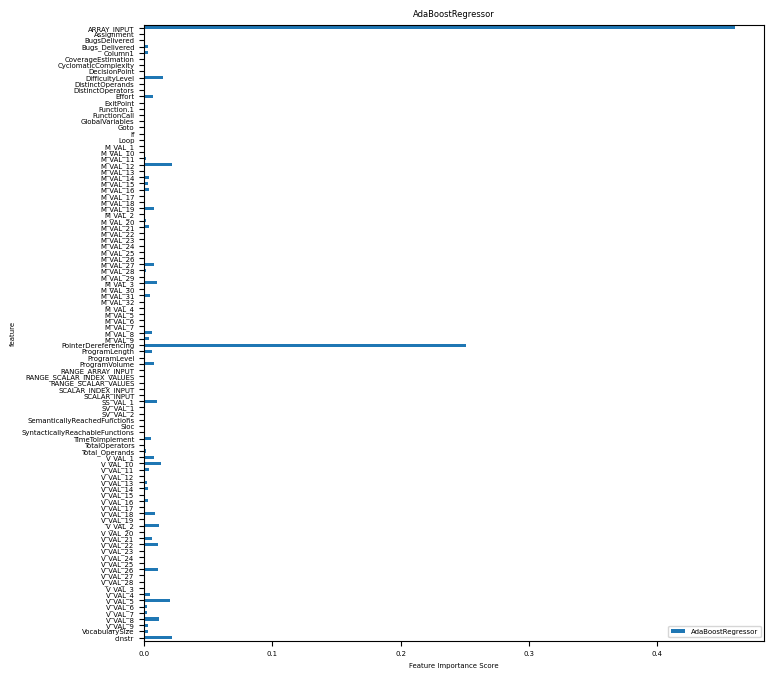

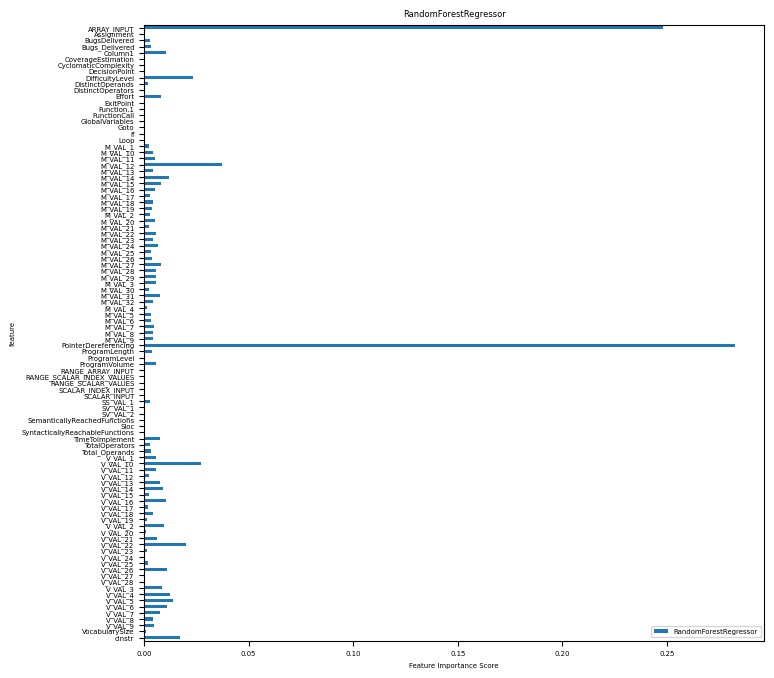

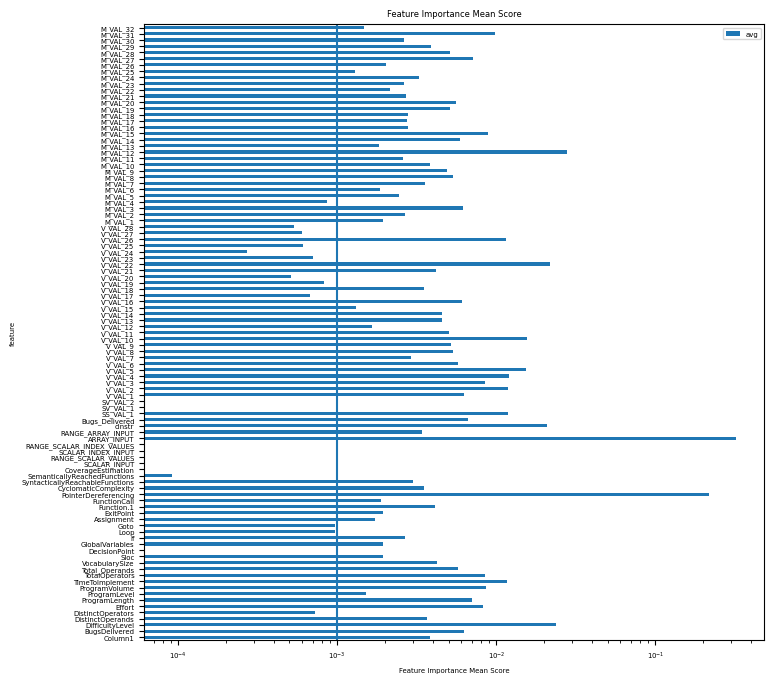

...

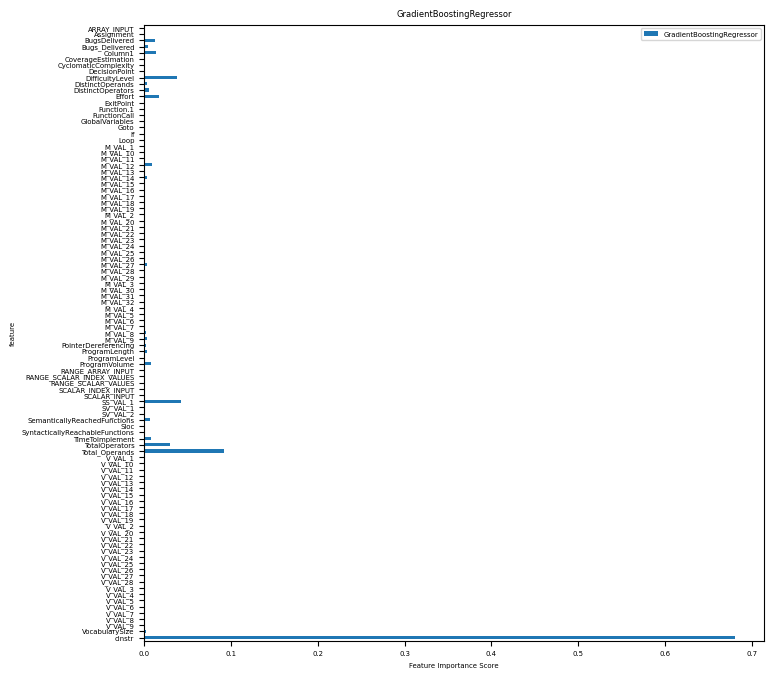

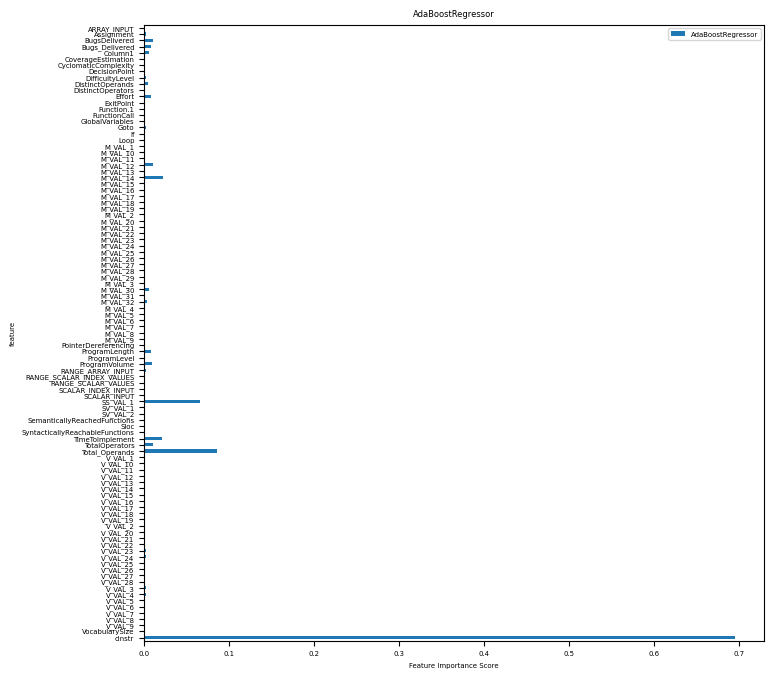

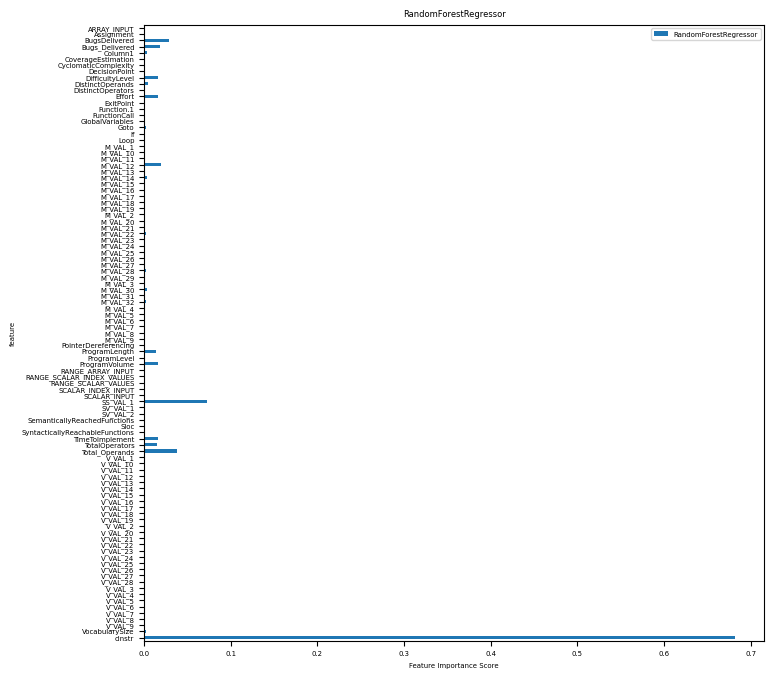

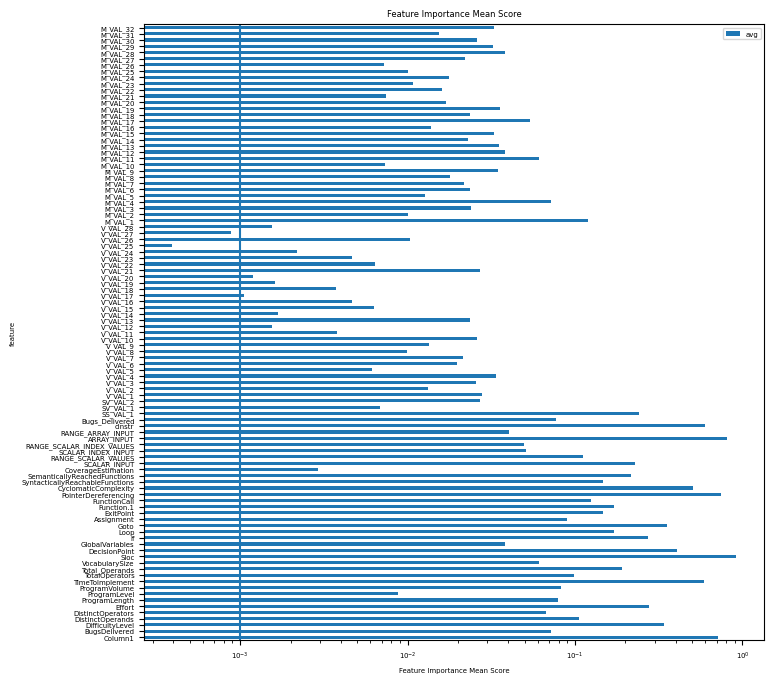

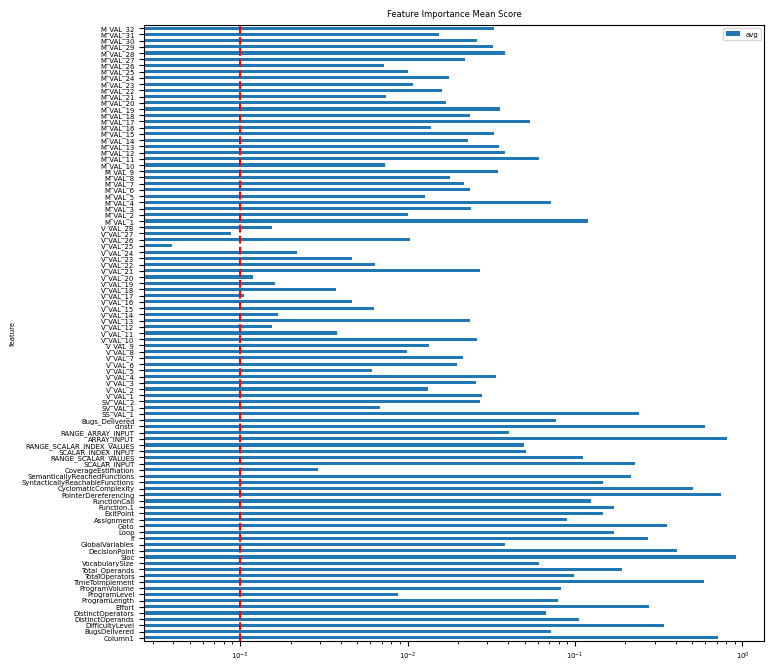

In [46]:
ESTIMATORS = 250

#from google.colab import files
#uploaded = files.upload()


# import required module
import os

# assign directory
directory = 'Dataset\csv\Train'
directory_Val = 'Dataset\csv\Val'
# filename = 'Artix-7.csv'

# iterate over files in that directory
for filename in os.listdir(directory): # INDENT
    f = os.path.join(directory, filename)
    fileTrainName = f.split('\\')
    # checking if it is a file
    if os.path.isfile(f):
        fileTrainNameNoFormat = fileTrainName[3].split('.')

        print("\n|------------------------------------|")
        print('\n' + fileTrainNameNoFormat[0] + '\n')
        print("|------------------------------------|\n")

    df = pd.read_csv(f, encoding = 'utf8', sep=',')
    # del df['Unnamed: 0']

    listHeader = list(df.columns.values)
    print(listHeader)
    print(listHeader[7:12])
    print(listHeader[49])
    y = df[["DSP", "BRAM", "Flip_Flop", "Area", "min_Slack", "Max_Freq","clockCycles"]]
    print(y)
    X = df.drop(['ID_VAL', 'DEVICE', 'BOARD', 'FUNCTION', 'DATA_TYPE', 'DSP', 'BRAM', 'Flip_Flop', 'Area', 'min_Slack', 'Max_Freq', 'Time', 'Energy', 'assemblyInstr', 'clockCycles', 'CC4CS'], axis=1)
    print(X)

    #temporary dataframe for results
    dfAllResults = pd.DataFrame()

    # X = df[listHeader].astype(float)

    for y_series_name, y_series in y.items():

        X_train, X_test, y_train, y_test = train_test_split(X, y_series, test_size=0.20, shuffle=False)

        ## Main Function

        clfs = [ExtraTreesRegressor(),
                GradientBoostingRegressor(learning_rate=0.1, n_estimators=ESTIMATORS),
                AdaBoostRegressor(learning_rate=0.1),
                RandomForestRegressor()
                ]

        print("\n|------------------------------------|")
        print('\n' + y_series_name + '\n')
        print("|------------------------------------|\n")

        file_name_path = 'FeatureImportRes\\generalScore\\'
        file_name_generalScore = fileTrainNameNoFormat[0] + y_series_name + '.png'

        for clf in clfs:
            try:
                _ = feature_importances_histo(clf, file_name_path, file_name_generalScore, X_train, y_train, top_n=X_train.shape[1], title=clf.__class__.__name__)
            except AttributeError as e:
                print(e)

        dfAllResults.set_index(['feature'], inplace=True)

        file_name_path = 'FeatureImportRes\\generalScore\\'
        file_name_generalScore = fileTrainNameNoFormat[0] + y_series_name + '.csv'
        dfAllResults.to_csv(os.path.join(file_name_path, file_name_generalScore), sep=',', encoding='utf-8', index=False)
        dfAllResults['sum'] = dfAllResults[dfAllResults.columns].sum(axis=1)
        dfAllResults['avg'] = dfAllResults['sum']/(len(dfAllResults.columns) - 1)
        file_name_path = 'FeatureImportRes\\allCLFscore\\'
        file_name = fileTrainNameNoFormat[0] + y_series_name + '.csv'
        dfAllResults.to_csv(os.path.join(file_name_path, file_name), sep='\t', encoding='utf-8')
        #files.download(file_name)

        print(dfAllResults)

        dfavg = dfAllResults[['avg']]
        file_name_path = 'FeatureImportRes\\scoreMean\\'
        file_name = fileTrainNameNoFormat[0] + y_series_name + '.csv'
        dfavg.to_csv(os.path.join(file_name_path, file_name), sep='\t', encoding='utf-8')
        #files.download(file_name)

        dfavg.plot.barh(title='Feature Importance Mean Score',logx=True, figsize=(8, 8))
        plt.xlabel('Feature Importance Mean Score')
        plt.xscale('log')
        plt.axvline(x=0.001)
        plt.rcParams.update({'font.size': 5})
        # plt.show()
        file_name_png = 'Mean' + fileTrainNameNoFormat[0] + y_series_name + '.png'
        # plt.savefig(os.path.join(file_name_path, file_name_png), format='png')

        print("\n=============   Feature Importance Mean Score   =============")
        print(dfavg)
        dfpruned = dfavg[~(dfavg['avg'] < 0.05)]
        print("\n=============   Feature Pruned by Score   =============")
        print(dfpruned)
        file_name_dataset_train_test_pruned = 'DatasetReduced/Pruned/' + fileTrainNameNoFormat[0] + '_' + y_series_name + '.csv' 
        dfpruned.to_csv(file_name_dataset_train_test_pruned, encoding='utf-8')

        df_pruned = pd.read_csv(file_name_dataset_train_test_pruned, encoding='utf-8')
        columnPruned = df_pruned[df_pruned.columns[0]].to_numpy()
        list_Pruned = columnPruned.tolist()
        print(list_Pruned)

        dfavg.plot.barh(title='Feature Importance Mean Score',logx=True, figsize=(8, 8))
        plt.xscale('log')
        plt.axvline(x=0.001, color='r', linestyle='--')
        plt.rcParams.update({'font.size': 5})
        # plt.show()
        file_name_png = 'MeanRed' + fileTrainNameNoFormat[0] + y_series_name + '.png'
        # plt.savefig(os.path.join(file_name_path, file_name_png), format='png')

        # remove features from df and save dataset file
        file_name_dataset_train = 'DatasetReduced/Train/' + fileTrainNameNoFormat[0] + '_' + y_series_name + '.csv' 
        df_X_train = pd.DataFrame(X_train)
        # df_X_train = df_X_train_1.drop(list_Pruned)
        # df_X_train.loc[:,~df_X_train.columns.str.contains('|'.join(list_Pruned))]
        for itemColTrain in list_Pruned:
            df_X_train = df_X_train.drop(str(itemColTrain), axis=1)       
        df_y_train = pd.DataFrame(y_train)
        df_final_train = pd.concat([df_X_train, df_y_train], axis=1)
        df_final_train.to_csv(file_name_dataset_train)

        file_name_dataset_test = 'DatasetReduced/Test/' + fileTrainNameNoFormat[0] + '_' + y_series_name + '.csv'
        df_X_test = pd.DataFrame(X_test)
        # df_X_test = df_X_test_1.drop(list_Pruned)
        # df_X_test.loc[:,~df_X_test.columns.str.contains('|'.join(list_Pruned))]
        for itemColTest in list_Pruned:
            df_X_test = df_X_test.drop(str(itemColTest), axis=1) 
        df_y_test = pd.DataFrame(y_test)
        df_final_test = pd.concat([df_X_test, df_y_test], axis=1)
        df_final_test.to_csv(file_name_dataset_test)

        # if os.path.exists(file_name_dataset_train_test_pruned):
        #     os.remove(file_name_dataset_train_test_pruned)
        # else:
        #     print(file_name_dataset_train_test_pruned)
            
        # FINAL TOTAL
        file_name_dataset_total = 'DatasetReduced/Total/' + fileTrainNameNoFormat[0] + '_' + y_series_name + '.csv'
        resultTotal = pd.concat([df_final_train, df_final_test], axis=0)
        resultTotal.to_csv(file_name_dataset_total)